# Generate two signals

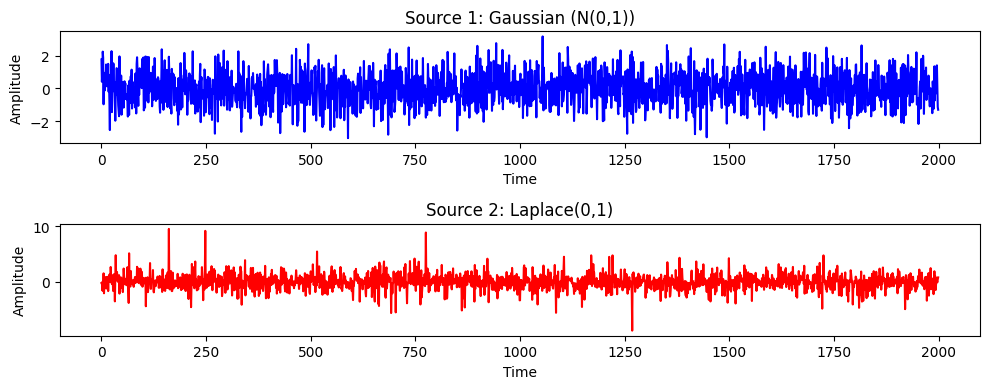

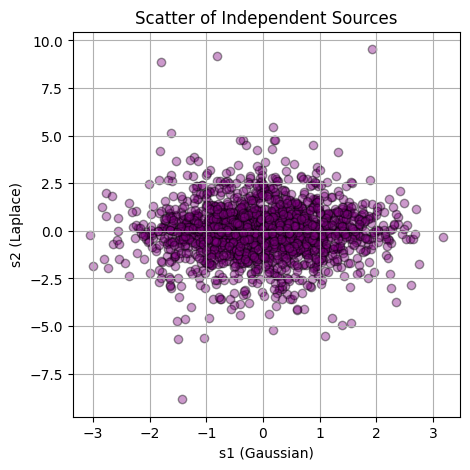

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import kurtosis
from scipy.stats import kurtosis, norm
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, HTML

# For reproducibility
np.random.seed(0)
n_samples = 2000

# --- Generate two independent sources ---
s1 = np.random.normal(0, 1, n_samples)      # Gaussian
s2 = np.random.laplace(0, 1, n_samples)     # Laplace (non-Gaussian)

# Combine into a matrix (each column = one source)
S = np.c_[s1, s2]

# --- Plot time series ---
plt.figure(figsize=(10,4))
plt.subplot(2,1,1)
plt.plot(s1, color="blue")
plt.title("Source 1: Gaussian (N(0,1))")
plt.xlabel("Time")
plt.ylabel("Amplitude")

plt.subplot(2,1,2)
plt.plot(s2, color="red")
plt.title("Source 2: Laplace(0,1)")
plt.xlabel("Time")
plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()

# --- Plot scatter (joint distribution) ---
plt.figure(figsize=(5,5))
plt.scatter(s1, s2, alpha=0.4, color="purple", edgecolor="k")
plt.title("Scatter of Independent Sources")
plt.xlabel("s1 (Gaussian)")
plt.ylabel("s2 (Laplace)")
plt.grid(True)
plt.show()


# 🔎 Signals vs. Random Variables

When we generate  

$s_1 = \{ s_1(t) \}_{t=1}^n, \quad s_2 = \{ s_2(t) \}_{t=1}^n$

with `numpy.random.normal` and `numpy.random.laplace`, here’s what’s happening:

- Each time index $t$ corresponds to a random draw.  
- Across **time**, the samples are independent and identically distributed (i.i.d.).  
- Across **sources**, $s_1$ and $s_2$ are drawn independently.  

So when we compute **mutual information** between $s_1$ and $s_2$ across time samples, it should indeed be close to **zero**, because they were generated independently.  

---

## 🔎 Why you feel they are "related by time"

You’re right that both signals are **time series**, meaning they share the same time axis.  

But in ICA, we don’t care about the ordering in time; we treat each time index $t$ as **one sample** from the joint distribution of $(s_1, s_2)$.  

Formally:  

$\mathbf{s}(t) = (s_1(t), s_2(t)), \quad p(s_1, s_2) = p(s_1) \, p(s_2)$

since the two sources were generated independently.  

That means **mutual information across sources = 0**.  

The fact that they are indexed by the same $t$ does **not** introduce statistical dependence.  

---

## ✅ Teaching Takeaway

- Two signals **sharing the same time axis** does **not** imply statistical dependence.  
- Dependence comes from their **joint distribution of values**, not from both being defined at $t = 1, 2, \dots, n$.  
- Since we generated $s_1$ and $s_2$ independently, their **mutual information is zero** (up to numerical noise).  


In [ ]:
import numpy as np
import math
from collections import Counter

# --- Step 1: Generate signals inside---
np.random.seed(0)
n_samples = 2000
s1 = np.random.normal(0, 1, n_samples)      # Gaussian
s2 = np.random.laplace(0, 1, n_samples)     # Laplace

# --- Step 2: Correlation function from scratch ---
def correlation(x, y):
    n = len(x)
    mean_x, mean_y = sum(x)/n, sum(y)/n
    num = sum((xi-mean_x)*(yi-mean_y) for xi, yi in zip(x,y))
    den = math.sqrt(sum((xi-mean_x)**2 for xi in x) * sum((yi-mean_y)**2 for yi in y))
    return num/den if den!=0 else 0

# --- Step 3: Mutual information function from scratch (histogram estimate) ---
def mutual_information(x, y, bins=30):
    n = len(x)
    # Bin edges
    x_bins = np.linspace(min(x), max(x), bins+1)
    y_bins = np.linspace(min(y), max(y), bins+1)
    # Digitize samples
    x_d = np.digitize(x, x_bins) - 1
    y_d = np.digitize(y, y_bins) - 1
    # Joint and marginals
    joint_counts = Counter(zip(x_d, y_d))
    px, py = Counter(x_d), Counter(y_d)
    mi = 0.0
    for (xi, yi), c in joint_counts.items():
        p_xy = c/n
        p_x, p_y = px[xi]/n, py[yi]/n
        mi += p_xy * math.log((p_xy/(p_x*p_y+1e-12))+1e-12, 2)  # log base-2
    return mi

# --- Step 4: Compute results ---
rho = correlation(s1.tolist(), s2.tolist())
mi = mutual_information(s1.tolist(), s2.tolist(), bins=30)

print(f"Correlation ρ = {rho:.4f}")
print(f"Mutual Information I(s1; s2) = {mi:.4f} bits")


Correlation ρ = 0.0147
Mutual Information I(s1; s2) = 0.1549 bits


# Mix the signals


Mixtures:
  Correlation ρ = 0.5863
  Mutual Information I = 0.3693 bits


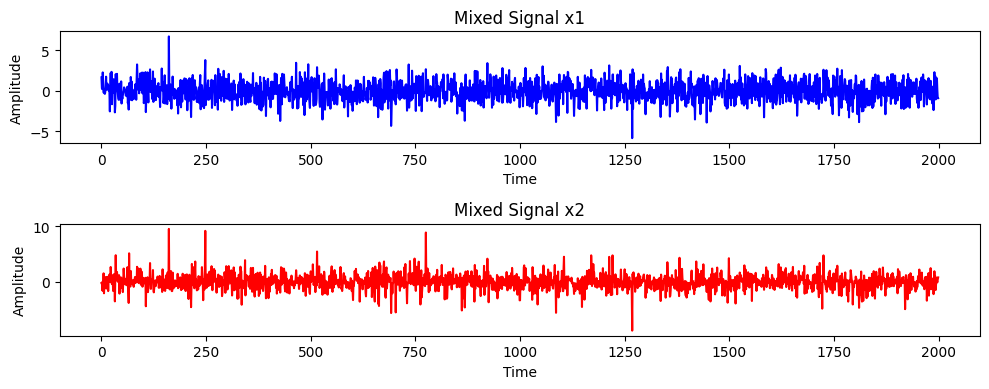

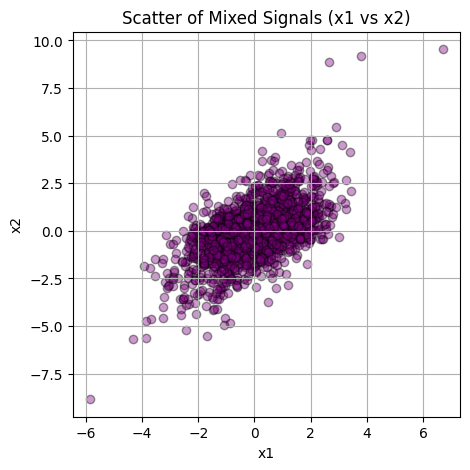

In [3]:
A = np.array([[1, 0.5],
              [0, 1]])   # arbitrary non-singular mixing matrix
X = S @ A.T  # Mixed signals
x1, x2 = X[:,0], X[:,1]
rho_mixed = correlation(x1.tolist(), x2.tolist())
mi_mixed  = mutual_information(x1.tolist(), x2.tolist(), bins=30)
print("\nMixtures:")
print(f"  Correlation ρ = {rho_mixed:.4f}")
print(f"  Mutual Information I = {mi_mixed:.4f} bits")
plt.figure(figsize=(10,4))
plt.subplot(2,1,1)
plt.plot(x1, color="blue")
plt.title("Mixed Signal x1")
plt.xlabel("Time")
plt.ylabel("Amplitude")

plt.subplot(2,1,2)
plt.plot(x2, color="red")
plt.title("Mixed Signal x2")
plt.xlabel("Time")
plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()

# --- Step 4: Scatter plot x1 vs x2 ---
plt.figure(figsize=(5,5))
plt.scatter(x1, x2, alpha=0.4, color="purple", edgecolor="k")
plt.title("Scatter of Mixed Signals (x1 vs x2)")
plt.xlabel("x1")
plt.ylabel("x2")
plt.grid(True)
plt.show()

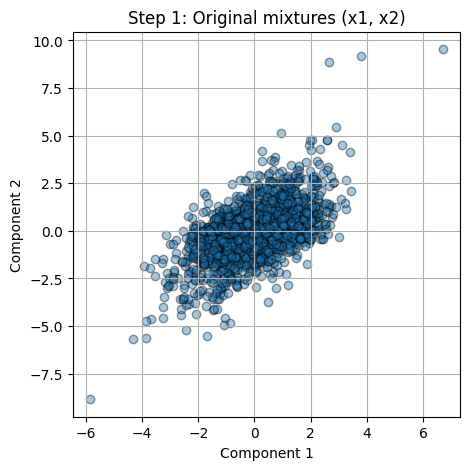

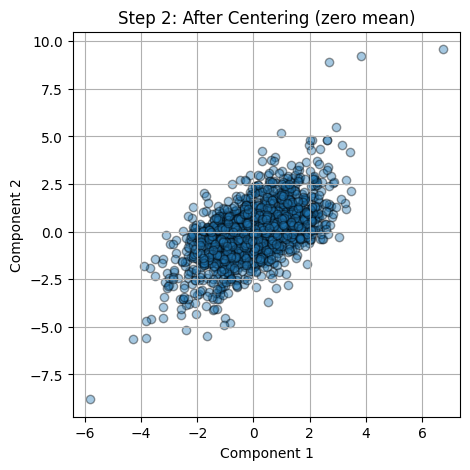

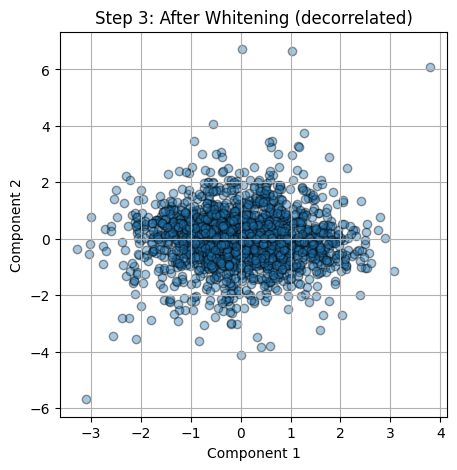

In [4]:
x1, x2 = X[:,0], X[:,1]

# Helper function for plotting scatter
def plot_scatter(data, title):
    plt.figure(figsize=(5,5))
    plt.scatter(data[:,0], data[:,1], alpha=0.4, edgecolor="k")
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.grid(True)
    plt.show()

# -------------------------------------------------
# Step 1: Original mixtures
# -------------------------------------------------
plot_scatter(X, "Step 1: Original mixtures (x1, x2)")

# -------------------------------------------------
# Step 2: Centering
# -------------------------------------------------
X_centered = X - X.mean(axis=0)
plot_scatter(X_centered, "Step 2: After Centering (zero mean)")

# -------------------------------------------------
# Step 3: Whitening
# -------------------------------------------------
cov = np.cov(X_centered.T)
E, D, _ = np.linalg.svd(cov)
D_inv_sqrt = np.diag(1.0 / np.sqrt(D))
X_white = X_centered @ E @ D_inv_sqrt @ E.T
plot_scatter(X_white, "Step 3: After Whitening (decorrelated)")



In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, norm
from ipywidgets import interact, IntSlider

# --- Precompute kurtosis for all angles ---
angles = np.arange(0, 181, 5)
kurt_vals = []
for angle in angles:
    theta = np.deg2rad(angle)
    w = np.array([np.cos(theta), np.sin(theta)])
    proj = X_white @ w
    kurt_vals.append(kurtosis(proj, fisher=True))

# --- Step 3: Projection function ---
def plot_projection(angle_deg=0):
    theta = np.deg2rad(angle_deg)
    w = np.array([np.cos(theta), np.sin(theta)])  # unit vector
    proj = X_white @ w

    fig, (ax_scatter, ax_hist, ax_kurt) = plt.subplots(1, 3, figsize=(15, 4))

    # --- Left: Scatter with projection axis ---
    ax_scatter.scatter(X_white[:,0], X_white[:,1], alpha=0.3, edgecolor="k")
    ax_scatter.plot([-3*w[0], 3*w[0]], [-3*w[1], 3*w[1]], 'r-', lw=2)
    ax_scatter.set_title("Whitened Data + Projection Axis")
    ax_scatter.set_xlim(-3, 3)
    ax_scatter.set_ylim(-3, 3)
    ax_scatter.set_xlabel("Component 1")
    ax_scatter.set_ylabel("Component 2")
    ax_scatter.grid(True)

    # --- Middle: Histogram + Gaussian overlay ---
    counts, bins, _ = ax_hist.hist(proj, bins=40, density=True, color="purple", alpha=0.6, label="Projection")
    mu, sigma = np.mean(proj), np.std(proj)
    x = np.linspace(min(proj), max(proj), 200)
    ax_hist.plot(x, norm.pdf(x, mu, sigma), 'k--', lw=2, label="Gaussian")
    ax_hist.set_title(f"Projection Histogram (θ={angle_deg}°)")
    ax_hist.set_xlabel("Value")
    ax_hist.set_ylabel("Density")
    ax_hist.legend()

    # --- Right: Kurtosis vs Angle ---
    ax_kurt.plot(angles, kurt_vals, 'b-')
    ax_kurt.axhline(0, color='k', linestyle='--')
    ax_kurt.plot(angle_deg, kurtosis(proj, fisher=True), 'ro', markersize=8)
    ax_kurt.set_title("Kurtosis vs Angle")
    ax_kurt.set_xlabel("Angle (deg)")
    ax_kurt.set_ylabel("Kurtosis")
    ax_kurt.grid(True)

    plt.tight_layout()
    plt.show()

# --- Step 4: Interactive widget ---
interact(plot_projection, angle_deg=IntSlider(min=0, max=180, step=5, value=0));

interactive(children=(IntSlider(value=0, description='angle_deg', max=180, step=5), Output()), _dom_classes=('…

In [6]:
# --- Step 3: Precompute kurtosis ---
angles = np.linspace(0, 180, 60)
kurt_vals = []
for angle in angles:
    theta = np.deg2rad(angle)
    w = np.array([np.cos(theta), np.sin(theta)])
    proj = X_white @ w
    kurt_vals.append(kurtosis(proj, fisher=True))

# Find best angle = max |kurtosis|
best_idx = np.argmax(np.abs(kurt_vals))
best_angle = angles[best_idx]
print(f"Most non-Gaussian projection at θ = {best_angle:.1f}° "
      f"(kurtosis = {kurt_vals[best_idx]:.2f})")

# --- Step 4: Setup figure ---
fig, (ax_scatter, ax_hist, ax_kurt) = plt.subplots(1, 3, figsize=(15, 4))

ax_scatter.scatter(X_white[:,0], X_white[:,1], alpha=0.3, edgecolor="k")
line, = ax_scatter.plot([], [], 'r-', lw=2)
dots, = ax_scatter.plot([], [], 'go', alpha=0.4)
ax_scatter.set_xlim(-3, 3)
ax_scatter.set_ylim(-3, 3)
ax_scatter.set_title("Whitened Data + Rotating Axis")
ax_scatter.grid(True)

ax_kurt.plot(angles, kurt_vals, 'b-')
point, = ax_kurt.plot([], [], 'ro', markersize=8)
ax_kurt.axhline(0, color='k', linestyle='--')
ax_kurt.set_xlim(0, 180)
ax_kurt.set_ylim(min(kurt_vals)-1, max(kurt_vals)+1)
ax_kurt.set_title("Kurtosis vs Angle")
ax_kurt.grid(True)

# --- Step 5: Animation function ---
def animate(frame):
    # Stop rotation once best angle is reached
    if frame >= best_idx:
        angle = best_angle
    else:
        angle = angles[frame]

    theta = np.deg2rad(angle)
    w = np.array([np.cos(theta), np.sin(theta)])
    proj = X_white @ w

    # Rotating red line
    line.set_data([-3*w[0], 3*w[0]], [-3*w[1], 3*w[1]])

    # Projected green dots
    proj_points = np.outer(proj, w)
    dots.set_data(proj_points[:,0], proj_points[:,1])

    # Histogram + Gaussian overlay
    ax_hist.cla()
    counts, bins, _ = ax_hist.hist(proj, bins=40, density=True, color="purple", alpha=0.6, label="Projection")
    mu, sigma = np.mean(proj), np.std(proj)
    x = np.linspace(min(proj), max(proj), 200)
    ax_hist.plot(x, norm.pdf(x, mu, sigma), 'k--', lw=2, label="Gaussian")
    ax_hist.set_xlim(-5, 5)
    ax_hist.set_ylim(0, max(counts)*1.2)
    ax_hist.set_title(f"Projection Histogram (θ={int(angle)}°)")
    ax_hist.set_xlabel("Value")
    ax_hist.set_ylabel("Density")
    ax_hist.legend()

    # Kurtosis marker
    point.set_data([angle], [kurt_vals[int(np.where(angles == angle)[0][0])]])

    return line, dots, point

# --- Step 6: Create animation ---
ani = animation.FuncAnimation(fig, animate, frames=len(angles), interval=100, blit=False, repeat=False)

# --- Step 7: Display inline in Jupyter ---
plt.close(fig)
display(HTML(ani.to_jshtml()))

Most non-Gaussian projection at θ = 73.2° (kurtosis = 4.89)


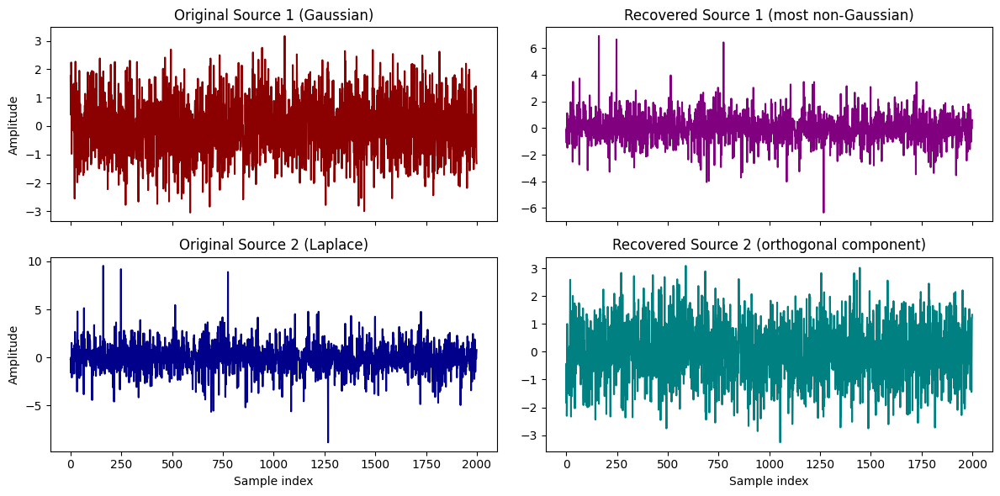

In [7]:
# --- Step 8: Recover the independent components ---

# Best direction (unit vector)
theta = np.deg2rad(best_angle)
w1 = np.array([np.cos(theta), np.sin(theta)])

# Orthogonal direction (for the second component)
w2 = np.array([-np.sin(theta), np.cos(theta)])

# Construct unmixing matrix W
W = np.vstack([w1, w2])

# Recover sources
S_est = X_white @ W.T

# --- Step 9: Compare with original sources ---
fig, axes = plt.subplots(2, 2, figsize=(12, 6), sharex=True)

# Original sources
axes[0,0].plot(s1, color="darkred")
axes[0,0].set_title("Original Source 1 (Gaussian)")
axes[0,0].set_ylabel("Amplitude")

axes[1,0].plot(s2, color="darkblue")
axes[1,0].set_title("Original Source 2 (Laplace)")
axes[1,0].set_xlabel("Sample index")
axes[1,0].set_ylabel("Amplitude")

# Recovered sources
axes[0,1].plot(S_est[:, 0], color="purple")
axes[0,1].set_title("Recovered Source 1 (most non-Gaussian)")

axes[1,1].plot(S_est[:, 1], color="teal")
axes[1,1].set_title("Recovered Source 2 (orthogonal component)")
axes[1,1].set_xlabel("Sample index")

plt.tight_layout()
plt.show()
